**ECO 541: Problem Set 3**  

Emily Merola | 2023.12.11

Notes about this work:
* Answers to this problem set are interspersed with this code.
* I collaborated with Calvin Jahnke, Cameron Ricciardi, and Rachel Moore while working on this problem set. 

***QUESTIONS 1 AND 2: Compute choice-specific value functions and plot***

In [41]:
# Housekeeping
using LinearAlgebra, Distributions, Plots, SparseArrays, Random, Parameters, BenchmarkTools, PiecewiseLinearApprox, Optim, StatsBase

In [42]:
## Calculate transition probabilities when we choose "maintenance"

# set up lognormal cdf
d = LogNormal(0, 1)
function F(x)
    cdf(d,x)
end

# function to calculate transition probability of a given point in the matrix
## see problem set for the formula
## key breakthrough was to see that the "max K" will change as we move up in the state space!
function tp(x,y,max)
    (F(y) - F(x))/F(max)
end

# vector of possible "states today"
xgrid = collect(range(0,49.99,step=0.01))

# matrix to hold transition probabilities
TP0 = zeros(5000,5000)

# fill in the matrix
for m = 1:5000
max1 = 5000-m+1
max2 = max1/100

tick1 = m-1
tick2 = m-2

for i = m:4999
j= i-tick1
k= i-tick2
TP0[m,i] = tp(xgrid[j],xgrid[k],max2)
end

TP0[m,5000] = tp(xgrid[max1],max2,max2)
end

# print the matrix as a sanity check
TP0


5000×5000 Matrix{Float64}:
 2.06074e-6  4.37045e-5  0.000181217  …  3.80034e-8  3.7966e-8   3.79287e-8
 0.0         2.06074e-6  4.37045e-5      3.80407e-8  3.80034e-8  3.7966e-8
 0.0         0.0         2.06074e-6      3.80781e-8  3.80407e-8  3.80034e-8
 0.0         0.0         0.0             3.81156e-8  3.80781e-8  3.80407e-8
 0.0         0.0         0.0             3.81531e-8  3.81156e-8  3.80781e-8
 0.0         0.0         0.0          …  3.81906e-8  3.81531e-8  3.81156e-8
 0.0         0.0         0.0             3.82282e-8  3.81906e-8  3.81531e-8
 0.0         0.0         0.0             3.82659e-8  3.82282e-8  3.81906e-8
 0.0         0.0         0.0             3.83035e-8  3.82659e-8  3.82282e-8
 0.0         0.0         0.0             3.83412e-8  3.83035e-8  3.82659e-8
 ⋮                                    ⋱                          
 0.0         0.0         0.0             0.182599    0.231547    0.280299
 0.0         0.0         0.0             0.187429    0.253714    0.321727


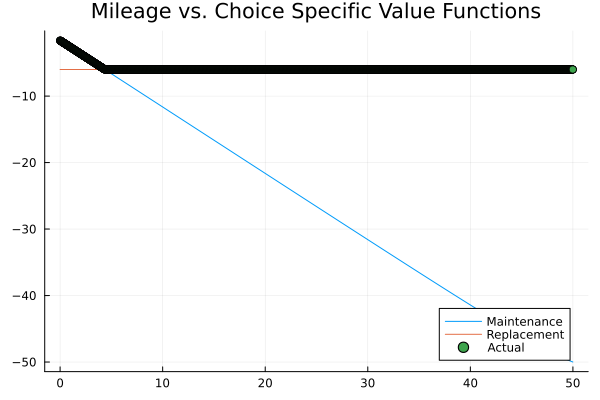

In [46]:
## Calculate transition probabilities when we choose "replace"
# trivial: regardless of the state today, if you replace the engine we will certainly have 0 mileage tomorrow.
TP1 = zeros(5000,5000)
for i = 1:5000
TP1[i,1] = 1
end

# Economic Parameters
β       = 0.5
RC      = 3

# Cost function
function cost(x)
    0.5*x
end

# Utility function without the error term
#my understanding is that we don't need to include the error term in every step because it would go away anyway. See slides.
#formula on slide 19/41
function utility(x,a)
    (-1)*cost(x*(1-a)) - a*RC
end

# Choice specific value function 
## some notes that helped https://julia.quantecon.org/dynamic_programming/discrete_dp.html#ddp-algorithms
## section 43.2.4. Two Operators

# start with a choice specific guess. Our initial guess is that the value is zero for all values of "tomorrow's" state.
V0_0 = zeros(1,5000)
V0_1 = zeros(1,5000)

# vector to fill in: value function specific to "maintenance"
V1_0 = zeros(5000,1)
V1_1 = zeros(5000,1)
V1 = zeros(5000,1)  # for the ultimate choice

# VFI: choice = "maintenance"
dist0 = 15
while dist0 >= 0.001
for i = 0:4999
    j= i/100
    k= i+1
    result = utility(j,0) .+ β*(V0_0 * TP0[k,:])
    V1_0[k] = result[1]
end 
dist0 = maximum(abs.(V1_0 - transpose(V0_0)))
V0_0 = copy(transpose(V1_0))
end

# VFI: choice = "replace"
dist1 = 15
while dist1 >= 0.001
for i = 0:4999
    j= i/100
    k= i+1
    result = utility(j,1) .+ β*(V0_1 * TP1[k,:])
    V1_1[k] = result[1]
    end 
dist1 = maximum(abs.(V1_1 - transpose(V0_1)))
V0_1 = copy(transpose(V1_1))
end

# suppose the state I'm in is x = 0. What choice should I make? Whichever one has a better value for me.
for i = 1:5000
    V1[i] = max(V1_1[i],V1_0[i])
end

# plotting
p1 = plot(xgrid,V1_0, label="Maintenance", seriestype = :line, legend=:bottomright)
p2 = plot(p1,xgrid,V1_1, label="Replacement", seriestype = :line, legend=:bottomright)
p3 = plot(p2,xgrid,V1, title="Mileage vs. Choice Specific Value Functions", label="Actual", seriestype = :scatter, legend=:bottomright)

#this one crosses at 43,800 miles or so

***QUESTION 3: What is the expected mileage at which you replace the engine?***


See above -- about 43,800 miles.

***QUESTION 4: Generate a dataset of observable states and choices for T = 20000 periods from the model.***

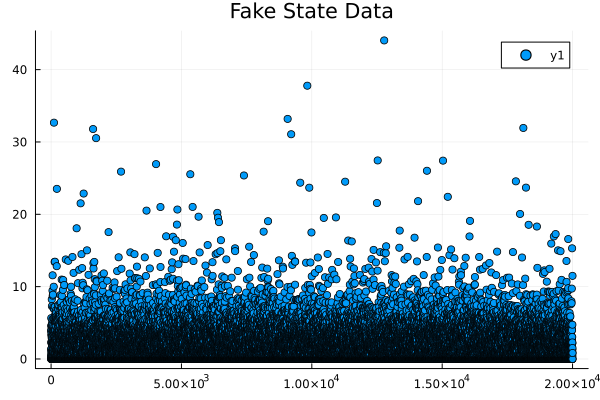

In [47]:
## Calculate choice probabilities using the stuff we solved for above, and then use those choice probabilities to generate the fake dataset (below)
P0 = zeros(5000,1)

## probability of choosing "maintenance", given the state I observe today (noted by the index in the below)
### note: formula for the choice probabilities is on slide 19/41 of the single agent dynamics slide deck (Lecture 16 in my notes)
### note: if you inspected this choice probabilities vector, you'd see that our mileage replacement rule is where we "tip over" (prob of maintenance<50%) 
for i = 1:5000
    P0[i] = exp(V1_0[i]) / (exp(V1_0[i]) + exp(V1_1[i]))
end 

## Generate a dataset of observable STATES and CHOICES for T = 20000 periods from the model.

# Structures to fill
T = 20000
Random.seed!(4321) # seed will give us reproducible products below
index = [1 for i in 1:T]
state = zeros(T,1)
decision = [0 for i in 1:T]

# Custom distributions to draw from
values = [0, 1]
dists0 = [Categorical(TP0[i, :]) for i in 1:5000]
dists1 = [Categorical(TP1[i, :]) for i in 1:5000]

# Loop through the simulated values we want
for i = 1:T-1
j= i+1

# Draw from the choice probabilities
probabilities = [P0[index[i]], 1-P0[index[i]]]
d = Categorical(probabilities)
decision[i]= values[rand(d)] # sampling

# Now, transition based on that choice
if decision[i]==0
    dist = dists0[index[i]]
end
if decision[i]==1
    dist = dists1[index[i]]
end
index[j] = rand(dist) # draw new value
state[j] = xgrid[index[j]]

end

# Plot the fake data
time = [i+1 for i=0:19999]
p3 = plot(time, state, title="Fake State Data", seriestype = :scatter)

***QUESTION 5: Estimate the model using Rust’s MLE/nested-fixed-point algorithm***

In [49]:
# Step 2 of Rust procedure: estimate mileage transition probabilities. (Step 1 of imputing Beta is below)

## condition on state today and examine all possible increments up.
# will create a vector of the "delta x_{t+1}" terms so that we can look at frequencies in the data
transition = zeros(T,1)
transition[T] = 0

for i=1:T-1
    j=i+1
transition[i] = state[j]-state[i]
end

states_trans = hcat(state,transition)

# will just do 10 x 10 for now
tp0= zeros(10,10)

#isolate relevant states "today"
for m=1:9
    n=m*5
    q=n+5
    r=m-1
    s=n-5

    states_trans_filter = states_trans[s .<= states_trans[:,1] .<n, :]

    #count the number of positive cases (total/denominator)
    result = states_trans_filter[0 .<= states_trans_filter[:,2], :]
    tot = size(result,1)

    if tot!=0
        #loop through possible xt+1's given the state today
        for i = m:9
            j= (i-r)*5
            k= j-5
        #count occurences of each shift
        states_trans_filter_2 = states_trans_filter[k .<= states_trans_filter[:,2] .<j, :]
        tp0[m,i] = size(states_trans_filter_2,1)/tot
        end

        tp0[m,10] = 1-sum(tp0[m,:])
    end
    if tot==0
        tp0[m,1] = 1
    end
end
tp0[10,1] = 1

## Set up functions that will be used running Rust's MLE/Nested Fixed Point algorithm

# Cost function
function cost(c,x)
    c*x
end

# Utility function without the error term
#formula on slide 19/41
function utility(RC,c,x,a)
    (-1)*cost(c,x*(1-a)) - a*RC
end

# map the observed states from the data to the new indexing / new values
function map(index, decision)
    index_new = [0 for i=1:20000]
    decision_new = [0 for i=1:20000]

    index_new = replace(index, 1 => 1)
    for i = 2:499
    index_new = replace(index_new, i => 1)
    end
    for j=2:10
        k=(j-1)*500
        m=(j*500)-1
        for i = k:m
            index_new = replace(index_new, i => j)
        end
    end

    ## map decisions to an index value
    decision_new = replace(decision, 1 => 2)
    decision_new = replace(decision_new, 0 => 1)

    return maps = (index_new=index_new, decision_new=decision_new)
end

# vfi
function VFI(EV0,EV1,RC,c)
    distance = 15
     while distance >= 0.001
     for i = 1:10
         j= i*5
     result0 = utility(RC,c,j,0) .+ β*(EV0)   #confirm
     result1 = utility(RC,c,j,1) .+ β*(EV0)   #confirm
     result = transpose(tp0[i,:])*log.(exp.(result0) + exp.(result1))
     EV1[i] = result[1]
     end
     distance = maximum(abs.(EV1 - transpose(EV0)))
     EV0 = copy(transpose(EV1))
    end
    return vfi = (EV0=EV0, EV1=transpose(EV1))
 end

# choice specific value functions (needed to calculate choice probabilities)
function choicefns(EV1,RC,c)
    v1 = zeros(10,1)
    for i = 1:10
        j = i*5
    v1[i] = utility(RC,c,j,1) + β*EV1[1]
    end
    v0 = zeros(10,1)
    for i = 1:10
        j = i*5
    v0[i] = utility(RC,c,j,0) + β*EV1[i]
    end
    return choicefns = (v0=v0, v1=v1)
end

# choice probabilities (needed for the likelihood function). See formula above.
function choiceprobs(v0,v1)
    cp0 = zeros(10,1) #probability of choosing maintenance
    for i = 1:10
        cp0[i] = exp(v0[i]) / (exp(v0[i]) + exp(v1[i]))
    end 
    cp1 = 1 .- cp0
    choice_prob = hcat(cp0, cp1)
    return choiceprobs = choice_prob
end

# computing likelihood function 
function likelihood(choice_prob, index_new, decision_new)

    ## second term
    latter = zeros(T,1)
    for i = 1:20000
    latter[i] = log(choice_prob[index_new[i],decision_new[i]])
    end

    ## first term
    former = zeros(T,1)
    former[1] = 1
    for i=2:20000
        j=i-1
    former[i] = tp0[index_new[j],index_new[i]]
    end

    # finally, the full likelihood
    likelihood = (-1)*(sum(latter)+sum(former))

    return l = (likelihood=likelihood)

end

# step 0: map data to new, coarsened indices
maps = map(index,decision)

# step 1: impute beta
β = 0.5

# step 2: estimate transition probabilities (see above)

# step 3: optimal parameter values through MLE (which uses a quite a few functions in between)
# the following just sets up the function we will optimize over.
function MLE(X)
    RC = X[1]
    c = X[2]
    EV0 = zeros(10,1)
    EV1 = zeros(1,10)
    solved_VFI = VFI(EV0,EV1,RC,c)
    solved_choicefns = choicefns(solved_VFI.EV0,RC,c)
    solved_choiceprobs = choiceprobs(solved_choicefns.v0, solved_choicefns.v1)
    solved_likelihood = likelihood(solved_choiceprobs, maps.index_new, maps.decision_new)
    return L = (solved_likelihood=solved_likelihood)
end

# Use Julia's built in optimize package
guess = [3,0.5]
opt = optimize(MLE,guess)
parameters = Optim.minimizer(opt)

2-element Vector{Float64}:
 4.09791923385526
 0.44088573360773164

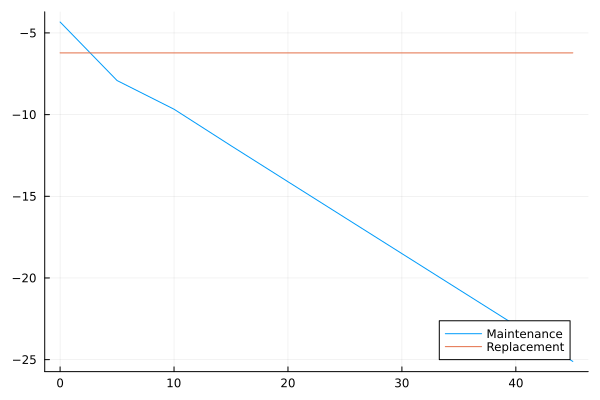

In [38]:
# Plotting an example of what this looks like
xcoarse = [i*5 for i=0:9]
EV0 = zeros(10,1)
EV1 = zeros(1,10)
solved_VFI = VFI(EV0,EV1,4.09,0.44)
solved_choicefns = choicefns(solved_VFI.EV0,4.09,0.44)
p1 = plot(xcoarse, solved_choicefns.v0, label="Maintenance", seriestype = :line, legend=:bottomright)
p2 = plot(p1, xcoarse, solved_choicefns.v1, label="Replacement", seriestype = :line, legend=:bottomright)

***QUESTION 6(a): CCP approach. Calculate replacement probabilities***

In [51]:
## Let's do this for 5 bins based on quantiles

## determining the quantile limits
state_data = state[:,1] # convert to a vector, quantile function won't accept a matrix as an input.
nquantile(state_data, 5)

    # groups I will commit to so far:
        ## 0 only
        ## 0< x <=1.16
        ## 1.16< x <=2.52
        ## 2.52< x <=4.22
        ## 4.22< x 
    quantiles = [0 1.16 2.52 4.22]

## dataset with the states combined with their decisions
state_decision = hcat(state, decision)
## first--> example of just the 0 group!

replace_prob = zeros(5,1)

### the lowest quantile category
base = state_decision[ quantiles[1] .== state_decision[:,1], :]
base_count = size(base,1)
top = base[1 .== base[:,2], :]
top_count = size(top,1) # "1" here refers to measuring the number of rows (length of the vector)
replace_prob[1] = top_count/base_count

### middle quantile categories
for i = 1:3
    j= i+1
base = state_decision[ quantiles[i] .< state_decision[:,1] .<= quantiles[j] , :]
base_count = size(base,1)
top = base[1 .== base[:,2], :]
top_count = size(top,1)
replace_prob[j] = top_count/base_count
end

### top quantile category
base = state_decision[ quantiles[4] .< state_decision[:,1], :]
base_count = size(base,1)
top = base[1 .== base[:,2], :]
top_count = size(top,1)
replace_prob[5] = top_count/base_count
replace_prob


5×1 Matrix{Float64}:
 0.010834236186348862
 0.02999117906498089
 0.07956827309236948
 0.2735660847880299
 0.7639097744360902

***QUESTION 6(b): CCP approach. Hotz-Miller inversion formula, differences in choice-specific value functions***

See slide 23/41 in the "single agent dynamics" deck for this formula. "$Pr()$" terms are the choice probabilities.

\begin{equation}
log(Pr(\text{replace}|x;\theta)) - log(Pr(\text{maintenance}|x;\theta)) = v_\theta(x,\text{replace}) - v_\theta(x,\text{maintenance}) 
\end{equation}

In [53]:
maint_prob = 1 .- replace_prob
valfn_diff = log.(replace_prob) - log.(maint_prob)

5×1 Matrix{Float64}:
 -4.514150787600923
 -3.4764018579443103
 -2.4482273941940456
 -0.9766042966842043
  1.1742356422301738

***QUESTION 6(c): Express per-period utility for each choice in terms of the parameters and the current state***

In [54]:
## will peg bin values to the midpoint of the bin range (these were based on quantiles) for now.
midpt = [0 0.58 1.84 3.37 24.13]

## actually calculating
util = zeros(5,2)
for i = 1:5
util[i,1] = utility(midpt[i],0)
util[i,2] = utility(midpt[i],1)
end
util

5×2 Matrix{Float64}:
  -0.0    -3.0
  -0.29   -3.0
  -0.92   -3.0
  -1.685  -3.0
 -12.065  -3.0

***QUESTION 6(d): Create conditional transition matrices F0 and F1***

In [55]:
# Data to use
states_trans_decision = hcat(states_trans, decision)

# Matrix to fill
tpq = zeros(5,5,2)

### isolate transitions where the choice was "maintenance"
decision_fltr = states_trans_decision[0 .== states_trans_decision[:,3],:]

    # starting in the "[1]" bin
    ### isolate the relevant states "today"
    states_fltr = decision_fltr[0 .== decision_fltr[:,1], :]

    ### count the number of positive transitions (total/denominator)
    result = states_fltr[0 .<= states_fltr[:,2], :]
    tot = size(result,1)

    ### actually calculate the probabilities

        # first column
        trans_fltr = states_fltr[0 .== states_fltr[:,2], :]
        tpq[1,1,1] = size(trans_fltr,1)/tot

        # middle column
        for i = 1:3
            j=i+1
        trans_fltr= states_fltr[quantiles[i] .< states_fltr[:,2] .<= quantiles[j], :]
        tpq[1,j,1] = size(trans_fltr,1)/tot
        end

        # last column
        trans_fltr= states_fltr[quantiles[4] .< states_fltr[:,2], :]
        tpq[1,5,1] = size(trans_fltr,1)/tot

    # starting in the "[2]" bin
    ### isolate the relevant states "today"
    states_fltr = decision_fltr[0 .< decision_fltr[:,1] .<= 1.16, :]

    ### count the number of positive transitions (total/denominator)
    result = states_fltr[0 .<= states_fltr[:,2], :]
    tot = size(result,1)

    ### actually calculate the probabilities

        # first column
        trans_fltr = states_fltr[0 .== states_fltr[:,2], :]
        tpq[2,2,1] = size(trans_fltr,1)/tot

        # middle column
        for i = 2:3
            j= i+1
            n= i-1
        trans_fltr= states_fltr[quantiles[n] .< states_fltr[:,2] .<= quantiles[i], :]
        tpq[2,j,1] = size(trans_fltr,1)/tot
        end

        # last column
        trans_fltr= states_fltr[quantiles[3] .< states_fltr[:,2], :]
        tpq[2,5,1] = size(trans_fltr,1)/tot

    ## starting in the "[3]" bin
    ### isolate the relevant states "today"
    states_fltr = decision_fltr[1.16 .< decision_fltr[:,1] .<= 2.52, :]

    ### count the number of positive transitions (total/denominator)
    result = states_fltr[0 .<= states_fltr[:,2], :]
    tot = size(result,1)

    ### actually calculate the probabilities

        # first column
        trans_fltr = states_fltr[0 .== states_fltr[:,2], :]
        tpq[3,3,1] = size(trans_fltr,1)/tot

        # middle column
        trans_fltr= states_fltr[quantiles[1] .< states_fltr[:,2] .<= quantiles[2], :]
        tpq[3,4,1] = size(trans_fltr,1)/tot

        # last column
        trans_fltr= states_fltr[quantiles[2] .< states_fltr[:,2], :]
        tpq[3,5,1] = size(trans_fltr,1)/tot

    ## starting in the "[4]" bin
    ### isolate the relevant states "today"
    states_fltr = decision_fltr[2.52 .< decision_fltr[:,1] .<= 4.22, :]

    ### count the number of positive transitions (total/denominator)
    result = states_fltr[0 .<= states_fltr[:,2], :]
    tot = size(result,1)

    ### actually calculate the probabilities

        # first column
        trans_fltr = states_fltr[0 .== states_fltr[:,2], :]
        tpq[4,4,1] = size(trans_fltr,1)/tot

        # last column
        trans_fltr= states_fltr[quantiles[1] .< states_fltr[:,2], :]
        tpq[4,5,1] = size(trans_fltr,1)/tot

    ## starting in the "[5]" bin
    ### isolate the relevant states "today"
    states_fltr = decision_fltr[4.22 .< decision_fltr[:,1], :]

    ### count the number of positive transitions (total/denominator)
    result = states_fltr[0 .<= states_fltr[:,2], :]
    tot = size(result,1)

    ### actually calculate the probabilities

        # first (and last) column
        trans_fltr = states_fltr[0 .< states_fltr[:,2], :]
        tpq[5,5,1] = size(trans_fltr,1)/tot

### Transitions if decision = replace
tpq[:,1,2] .= 1

# print as a sanity check
tpq

5×5×2 Array{Float64, 3}:
[:, :, 1] =
 0.0  0.564513     0.256955  0.1069    0.071632
 0.0  0.000303122  0.561988  0.260685  0.177023
 0.0  0.0          0.0       0.556313  0.443687
 0.0  0.0          0.0       0.0       1.0
 0.0  0.0          0.0       0.0       1.0

[:, :, 2] =
 1.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0

***QUESTION 6(e): Create unconditional transition matrix***

In [56]:
# takes into account the probability of replacement as well as the transition probabilities
# matrix to fill
uncon_tpq = zeros(5,5)

# fillting the matrix cell-by-cell
for j = 1:5
for i = 1:5 
    # I could replace AND transition to [i]
    ## Prob I choose replace * prob we transition to [1] from [1] given "replace"
    r = replace_prob[j]*tpq[j,i,2]

    # OR, I could maintain AND transition to [i]
    ## Prob I choose maintenance * prob we transition to [1] from [1] given "maintenance"
    m = maint_prob[j]*tpq[j,i,1]

    # sum of probabilities of these two possibilities
    uncon_tpq[j,i] = r + m
end
end

# print as a sanity check
uncon_tpq

5×5 Matrix{Float64}:
 0.0108342  0.558397     0.254171  0.105742  0.0708559
 0.0299912  0.000294031  0.545134  0.252867  0.171714
 0.0795683  0.0          0.0       0.512048  0.408384
 0.273566   0.0          0.0       0.0       0.726434
 0.76391    0.0          0.0       0.0       0.23609

***QUESTION 6(f): Write the procedure for forward simulating and calculating v-tilde***

In [58]:
## E[epsilon | a,x] terms
# define euler's constant
gamma = 0.57721566490153286060651209008240243

# matrix to fill
exp_epsilon = zeros(5,2)

# fill the matrix
exp_epsilon[:,1] = gamma .- log.(maint_prob)
exp_epsilon[:,2] = gamma .- log.(replace_prob)

# structures to fill
periods = 15
sims = 100
label1 = ones(Int8,periods,sims,5)
label2 = ones(Int8,periods,sims,5)
bucket1 = zeros(periods,sims,5)
bucket2 = zeros(periods,sims,5)
choice1 = zeros(Int8,periods,sims,5) # there is one version where we will want to start with maintenance and walk forward
choice2 = ones(Int8,periods,sims,5) # there is another where we will want to start with replace and walk forward

# adjust the starting values for the different state buckets
for m = 2:5
label1[1,:,m] .= m
bucket1[1,:,m] .= midpt[m]

label2[1,:,m] .= m
bucket2[1,:,m] .= midpt[m]
end

# Custom distributions to draw from
values = [0, 1]
dists0 = [Categorical(tpq[i, :, 1]) for i in 1:5] # splits out matrix into rows to call on depending on "state today"
dists1 = [Categorical(tpq[i, :, 2]) for i in 1:5] 

# # Loop through the simulated values we want

## do this once for "starting with MAINTENANCE / walking forward"
# loop through the different starting/initial values for states
for m = 1:5
# loop through each of the 100 simulations
for k = 1:100
# loop through the 15 periods forward
for i = 1:periods-1
    j = i+1
# pulling tomorrow's state
if choice1[i,k,m]==0
    dist = dists0[label1[i,k,m]] # chooses row to use based on "state today"
end
if choice1[i,k,m]==1
    dist = dists1[label1[i,k,m]]
end
label1[j,k,m] = rand(dist) # draw new value
bucket1[j,k,m] = midpt[label1[j,k,m]] # label what the new value is

# pulling the choice for tomorrow
probs = [maint_prob[label1[j,k,m]], replace_prob[label1[j,k,m]]]
d = Categorical(probs)
choice1[j,k,m]= values[rand(d)] # sampling
end
end
end

## one more time "starting with REPLACE / walking forward"
# loop through the different starting/initial values for states
for m = 1:5
# loop through each of the 100 simulations
for k = 1:100
# loop through the 15 periods forward
for i = 1:periods-1
    j = i+1
# pulling tomorrow's state
if choice2[i,k,m]==0
    dist = dists0[label2[i,k,m]] # chooses row to use based on "state today"
end
if choice2[i,k,m]==1
    dist = dists1[label2[i,k,m]]
end
label2[j,k,m] = rand(dist) # draw new value
bucket2[j,k,m] = midpt[label2[j,k,m]] # label what the new value is

# pulling the choice for tomorrow
probs = [maint_prob[label2[j,k,m]], replace_prob[label2[j,k,m]]]
d = Categorical(probs)
choice2[j,k,m]= values[rand(d)] # sampling
end
end
end

## Set up functions for estimating using CCPs

# Cost function
function cost(c,x)
    c*x
end

# Utility function without the error term
#my understanding is that we don't need to include the error term in every step because it would go away anyway. See slides.
#formula on slide 19/41
function utility(RC,c,x,a)
    (-1)*cost(c,x*(1-a)) - a*RC
end

# Per-period utility for each choice in terms of the parameters and the current state
function utils(RC,c,midpt)
    util = zeros(5,2)
    for i = 1:5
    util[i,1] = utility(RC,c,midpt[i],0)
    util[i,2] = utility(RC,c,midpt[i],1)
    end
    return utils = (util = util)
end

# Calculating the value functions
function v_tildes(label1, label2, choice1, choice2, util)
    
    β = 0.5
    ## vectors to fill
    vals = zeros(periods,sims,5)
    sim_sum = zeros(sims,5)
    v_tilde = zeros(5,2)

    ## betas
    betas = [(β^i) for i=0:periods-1]

    #one version for MAINTENANCE at the start
    ## loop through the possible "states today"
    for k = 1:5

    ## loop through each of the simulations
    for j = 1:sims

    ## first term/value: JUST utility
    vals[1,j,k] = util[label1[1,j,k],1]

    ## rest of the values
    for i = 2:periods
    vals[i,j,k] = util[label1[i,j,k],1] .+ exp_epsilon[label1[i,j,k],(choice1[i,j,k]+1)]
    end
    end

    ## summed terms:
    for j = 1:sims
    sim_sum[j,k] = transpose(betas)*vals[:,j,k]
    end

    ## average:
    v_tilde[k,1] = mean(sim_sum[:,k])
    end


    #one version for REPLACEMENT at the start
    ## loop through the possible "states today"
    for k = 1:5

    ## loop through each of the simulations
    for j = 1:sims

    ## first term/value: JUST utility
    vals[1,j,k] = util[label2[1,j,k],2]

    ## rest of the values
    for i = 2:periods
    vals[i,j,k] = util[label2[i,j,k],2] .+ exp_epsilon[label2[i,j,k],(choice2[i,j,k]+1)]
    end
    end

    ## summed terms:
    for j = 1:sims
    sim_sum[j,k] = transpose(betas)*vals[:,j,k]
    end

    ## average:
    v_tilde[k,2] = mean(sim_sum[:,k])
    end

    v_tilde
    maint = v_tilde[:,1]
    repl = v_tilde[:,2]

    return v_tilde = (maint = maint, repl = repl)
end


# calculating new choice probabilities
function new_probs(repl, maint)
    new_replace_prob = zeros(5,1)

    for i = 1:5
    new_replace_prob[i] = exp(repl[i]) / (exp(maint[i])+exp(repl[i]))
    end

    return new_probs = (new_replace_prob = new_replace_prob)
end 

# calculate distance / the value to optimize over
function distance(replace_prob, new_replace_prob)
    diffs = (log.(replace_prob) .- log.(new_replace_prob)).^2
    norm = sqrt(sum(diffs))
    return distance = (norm = norm)
end

# Overall for a given guess of theta
function CCP(X)
    RC = X[1]
    c = X[2]
    solved_utils = utils(RC, c, midpt)
    solved_v_tilde = v_tildes(label1, label2, choice1, choice2, solved_utils)
    solved_newprobs = new_probs(solved_v_tilde.repl, solved_v_tilde.maint)
    solved_distance = distance(replace_prob, solved_newprobs)
    return D = (solved_distance=solved_distance)
end

# Use Julia's built in optimize package
guess = [3,0.5]
opt = optimize(CCP,guess)
parameters = Optim.minimizer(opt)

2-element Vector{Float64}:
 2.922854390125157
 0.2816170395049163

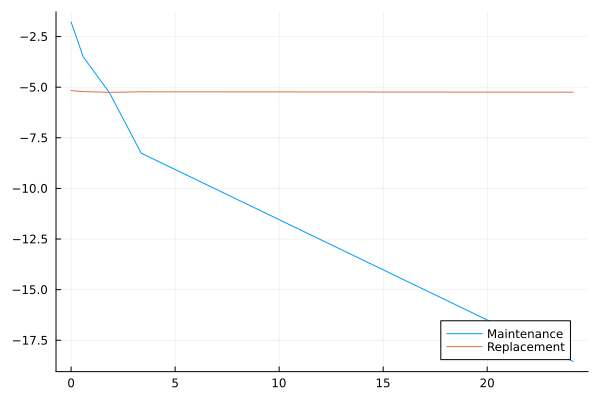

In [59]:
## Plotting an example
solved_utils = utils(3, 0.5, midpt)
solved_v_tilde = v_tildes(label1, label2, choice1, choice2, solved_utils)
p1 = plot(transpose(midpt), solved_v_tilde.maint, label="Maintenance", seriestype = :line, legend=:bottomright)
p2 = plot(p1, transpose(midpt), solved_v_tilde.repl, label="Replacement", seriestype = :line, legend=:bottomright)

***QUESTION 7: Come up with an applied question and setting in which such a model might apply and describe (in words and equations) the problem in a few paragraphs. What would the ideal data set look like for this question?***

One applied setting where a single agent DDC model could apply are questions about individuals' decisions about consuming health care. For the sake of limiting to what seems like a simpler case, the following will focus on one type of health care (dental) and will divide actions into 3 possibilities in each period: (1) going for regular / routine care, and (2) going for more serious care (e.g., involving surgery), and (3) doing neither. Dental care might seem relatively "low-stakes" compared to other areas of health care, but it does have qualities that seem to map well to the DDC set up (and perhaps this simpler example could be extended to different types of health care). These qualities are the following:

* whether a person receives dental care will change how their dental health evolves in future periods
* depending on a person's current dental health and how they expect that health to evolve, dental care will seem more or less "worth the cost"
* as such the choices made in the present about dental care are dependent on choices made in the past, and the choice in the present will in turn effect future choices

In each period, we could imagine an individual comparing the trade off between (1) avoiding the costs of dental care (but their dental health will be at a higher risk deterioriating), (2) undertaking routine care such as cleanings (which has associated costs and improves dental health, but can only do "so much" to improve this health and prevent deterioration), and (3) going for more serious care (which has the highest costs, but also the greatest benefits in terms of improving dental health and reversing deterioration). 

An **ideal dataset** for this would be a panel dataset that includes a variable (or variables) that describe individuals' dental health over time, as well as variables for whether they (1) attended any routine care or (2) had more serious care in a given period. In each period, we could assume that (similar to Harold!), individuals observe the same variables describing their dental health, as well as an "unobserved" component to their health that the researcher cannot see. 

Individuals would use this information (combined with their expectations about how their health will evolve) to make their choice about care in a given period. In particular, they make their choice to maximize their expected present discounted value of utility for all periods in the future (which could be rewritten in terms of recursive value functions). Entering directly into a person's utility function would be (1) costs of care that depend on the choice, and (2) a terms that captures benefits from health. For instance, we could have the following, where individuals choose a sequence of actions $a = \{a_1,a_2,a_3,...\}$:

\begin{equation*}
\underset{a}{\text{max}} = E \sum_{t=1}^{\infty}\beta^{t-1}u(x_{it},\epsilon_{it}, a_t)
\end{equation*}

\begin{equation*}
u(a = \text{``no care"},x_{it},\epsilon_{it}) = \alpha x_{it} + \epsilon_{it}(a)
\end{equation*}

\begin{equation*}
u(a = \text{``routine"},x_{it},\epsilon_{it}) = \alpha x_{it} - C_1 + \epsilon_{it}(a)
\end{equation*}

\begin{equation*}
u(a = \text{``serious"},x_{it},\epsilon_{it}) = \alpha x_{it} - C_2 + \epsilon_{it}(a)
\end{equation*}

\begin{equation*}
C_1< C_2
\end{equation*}

And the main parameters to estimate would be $\alpha$, $C_1$, and $C_2$, and the parameters governing dental health transitions. Dental health transitions $F(x_{it+1}|x_{it}, a_t)$ could be stochastic to reflect that health shocks happen (i.e., dental health is not completely deterministic based on an individual's choices). Nonetheless, the transition matrices (as in this problem set re: Harold) could vary with the choice made in the present. The intuition behind this is that "no care" would put a person more at risk of poor health in the future, "routine" care would help buffer against these risks, but can't prevent all shocks or deterioiration, and "serious care" would be the only chance to "reverse" deterioration or "reset" dental health.

The same common assumptions (i.e., those on slide 10/41 in the "single agent dynamics" deck) could be made as well. Once this model is estimated, one could consider what happens to individuals' behavior under counterfactuals (e.g., if costs of routine care, or serious care, increased or decreased).
